In [1]:
# import libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
import seaborn as sns

plt.style.use("fivethirtyeight")
import plotly.express as px
import plotly.graph_objects as go

pd.options.display.max_columns = 999
%load_ext nb_black

project_root_dir = os.path.normpath(os.getcwd() + os.sep + os.pardir)
file_path = os.path.join(project_root_dir, "data")

# function for loading data
def load_data(filename, file_path=file_path):
    csv_path = os.path.join(file_path, filename)
    return pd.read_csv(csv_path)

<IPython.core.display.Javascript object>

# Batting

## Runs

In [2]:
batting = load_data("batting.csv")
batting.head()

,POS,PLAYER,Mat,Inns,NO,Runs,HS,Avg,BF,SR,100,50,4s,6s,Nationality,Player Link,Team,Season
0,1,David Warner,12,12,2,692,100,69.20,481,143.86,1,8,57,21,Overseas,https://www.iplt20.com/teams/sunrisers-hyderab...,Sunrisers Hyderabad,2019
1,2,KL Rahul,14,14,3,593,100,53.90,438,135.38,1,6,49,25,Indian,https://www.iplt20.com/teams/kings-xi-punjab/s...,Kings Xi Punjab,2019
2,3,Quinton de Kock,16,16,1,529,81,35.26,398,132.91,0,4,45,25,Overseas,https://www.iplt20.com/teams/mumbai-indians/sq...,Mumbai Indians,2019
3,4,Shikhar Dhawan,16,16,1,521,97,34.73,384,135.67,0,5,64,11,Indian,https://www.iplt20.com/teams/delhi-capitals/sq...,Delhi Capitals,2019
4,5,Andre Russell,14,13,4,510,80,56.66,249,204.81,0,4,31,52,Overseas,https://www.iplt20.com/teams/kolkata-knight-ri...,Kolkata Knight Riders,2019


<IPython.core.display.Javascript object>

In [3]:
batting.iloc[batting[batting["PLAYER"] == "Rohit Sharma"].index, 16] = "Mumbai Indians"

<IPython.core.display.Javascript object>

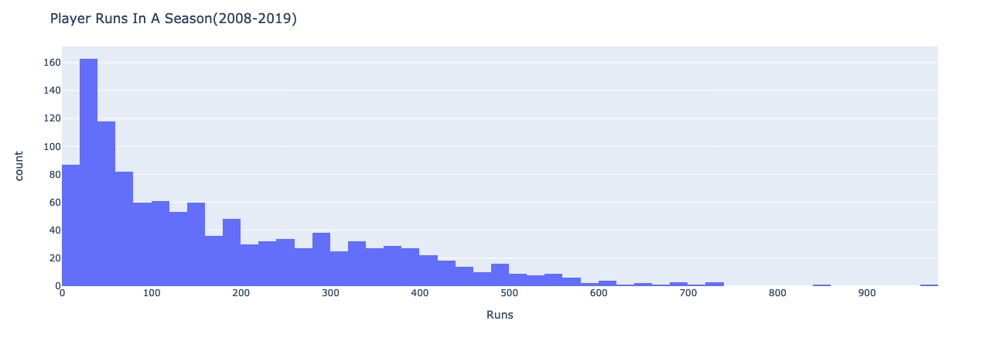

<IPython.core.display.Javascript object>

In [4]:
fig = px.histogram(batting, x="Runs")
fig.update_layout(title="Player Runs In A Season(2008-2019)")
fig.show()

In [5]:
batting["Runs"].describe()

count    1200.000000
mean      179.561667
std       158.172949
min         8.000000
25%        47.000000
50%       126.000000
75%       283.250000
max       973.000000
Name: Runs, dtype: float64

<IPython.core.display.Javascript object>

We can see that the distribution is right skewed. Many players make less runs, while few player makes lots of runs.
50% of the players makes less than 126 in a season and 50% above it. And 75% of the players makes less than 283 runs.
The range is 965. 

In [6]:
# what is the 90th percentile
np.percentile(batting["Runs"], 90)

406.3000000000004

<IPython.core.display.Javascript object>

In [7]:
# what is the 80th percentile
np.percentile(batting["Runs"], 80)

324.0

<IPython.core.display.Javascript object>

In [8]:
from scipy import stats

# what is the percentile rank of 300 runs
stats.percentileofscore(batting["Runs"], 300)

77.5

<IPython.core.display.Javascript object>

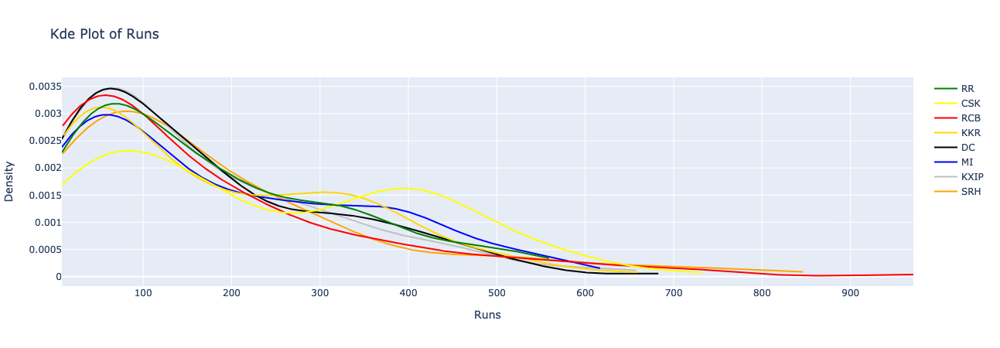

<IPython.core.display.Javascript object>

In [9]:
import plotly.figure_factory as ff

unique_teams = batting["Team"].unique()

hist_data = [
    batting[batting["Team"] == team]["Runs"] for team in unique_teams if team != "Nan"
]
group_labels = ["SRH", "KXIP", "MI", "DC", "KKR", "RCB", "CSK", "RR"]
colors = ["Orange", "Silver", "Blue", "Black", "Gold", "Red", "Yellow", "Green"]

fig = ff.create_distplot(
    hist_data, group_labels, show_hist=False, show_rug=False, colors=colors
)
fig.update_layout(
    title="Kde Plot of Runs", xaxis=dict(title="Runs"), yaxis=dict(title="Density")
)
fig.show()

In [10]:
team_runs_summary = (
    batting.groupby("Team")["Runs"].describe().sort_values(by="mean", ascending=False)
)
team_runs_summary

,count,mean,std,min,25%,50%,75%,max
Team,,,,,,,,
Chennai Super Kings,104.0,235.894231,178.819805,8.0,71.50,191.5,396.00,733.0
Mumbai Indians,153.0,187.627451,158.783860,8.0,45.00,133.0,320.00,618.0
Sunrisers Hyderabad,88.0,180.556818,179.561974,9.0,52.75,122.5,246.00,848.0
Kolkata Knight Riders,140.0,178.664286,153.182527,10.0,38.75,131.5,298.00,660.0
Rajasthan Royals,115.0,178.547826,147.096176,8.0,56.50,135.0,293.00,560.0
Nan,151.0,171.066225,138.924520,14.0,49.50,127.0,280.00,569.0
Kings Xi Punjab,154.0,167.961039,146.124349,11.0,47.25,122.0,254.00,659.0
Delhi Capitals,138.0,166.862319,143.552894,8.0,47.00,125.0,255.75,684.0
Royal Challengers Bangalore,157.0,166.082803,177.777373,9.0,37.00,98.0,226.00,973.0


<IPython.core.display.Javascript object>

After segmenting the runs distribution by team, it is clear that percentage of players making runs within the 300 
range is lower for csk compared to other teams and the higher within the range 300 to 600, which is what you want. 
Less percentage at the lower end and higher at the middle and upper end. On average, csk players make 235 runs, 
compared to 187 runs by Mumbai Indians which is the second highest.

In [11]:
# Number of times a Player made more than 500 runs in a season
more_than_500 = (
    batting[batting["Runs"] > 500]["PLAYER"]
    .value_counts()
    .reset_index()
    .rename(columns={"index": "Player", "PLAYER": "Count"})
)
more_than_500

,Player,Count
0,David Warner,5
1,Virat Kohli,5
2,Chris Gayle,3
3,Gautam Gambhir,3
4,Suresh Raina,3
5,Shikhar Dhawan,3
6,Ajinkya Rahane,2
7,KL Rahul,2
8,AB de Villiers,2
9,Shaun Marsh,2


<IPython.core.display.Javascript object>

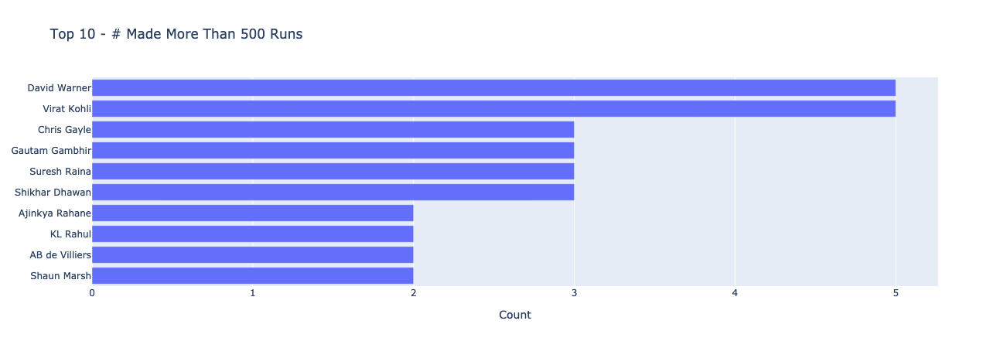

<IPython.core.display.Javascript object>

In [12]:
fig = go.Figure()
fig.add_trace(
    go.Bar(
        x=more_than_500["Count"][:10], y=more_than_500["Player"][:10], orientation="h"
    )
)
fig.update_layout(
    title="Top 10 - # Made More Than 500 Runs",
    yaxis=dict(autorange="reversed"),
    xaxis=dict(title="Count"),
)
fig.show()

In [13]:
# Number of times a player made more than 400 runs in a season
more_than_400 = (
    batting[batting["Runs"] > 400]["PLAYER"]
    .value_counts()
    .reset_index()
    .rename(columns={"index": "Player", "PLAYER": "Count"})
)
more_than_400

,Player,Count
0,Suresh Raina,9
1,Rohit Sharma,7
2,David Warner,6
3,Virat Kohli,6
4,Gautam Gambhir,5
5,Shikhar Dhawan,5
6,Chris Gayle,5
7,Virender Sehwag,4
8,MS Dhoni,4
9,AB de Villiers,4


<IPython.core.display.Javascript object>

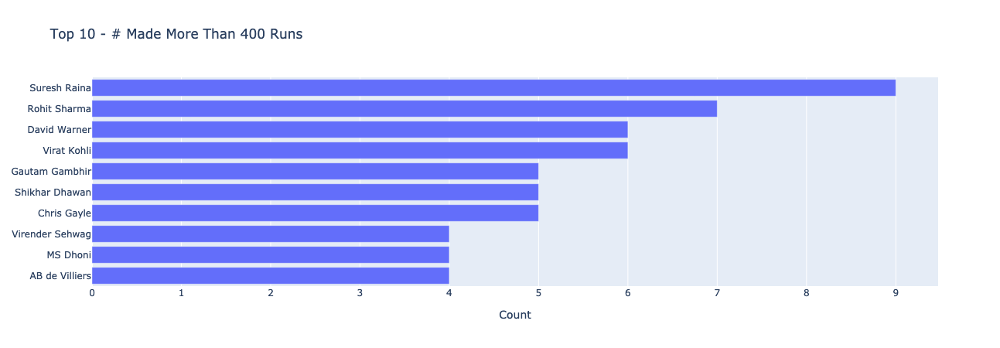

<IPython.core.display.Javascript object>

In [14]:
fig = go.Figure()
fig.add_trace(
    go.Bar(
        x=more_than_400["Count"][:10], y=more_than_400["Player"][:10], orientation="h"
    )
)
fig.update_layout(
    title="Top 10 - # Made More Than 400 Runs",
    yaxis=dict(autorange="reversed"),
    xaxis=dict(title="Count"),
)
fig.show()

In [15]:
most_runs_all_time = pd.pivot_table(
    batting, index="PLAYER", values="Runs", aggfunc="sum"
).sort_values(by="Runs", ascending=False)

<IPython.core.display.Javascript object>

In [16]:
# Top 15 players
most_runs_all_time[:15]

,Runs
PLAYER,
Virat Kohli,5412
Suresh Raina,5368
Rohit Sharma,4898
Shikhar Dhawan,4619
David Warner,4543
Chris Gayle,4484
MS Dhoni,4432
Robin Uthappa,4411
Gautam Gambhir,3931


<IPython.core.display.Javascript object>

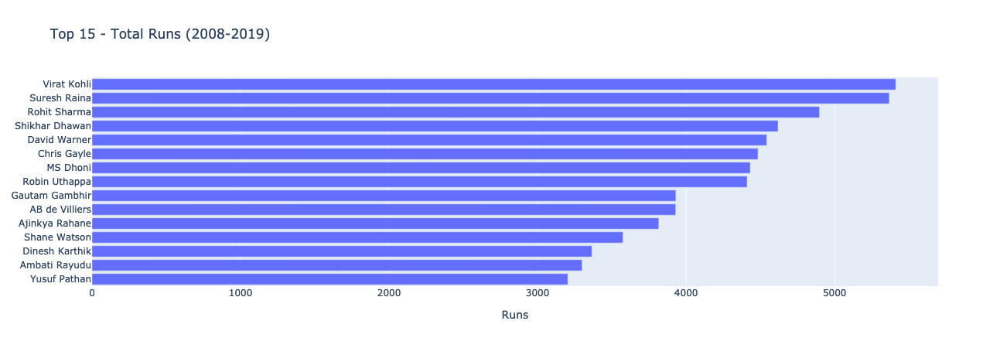

<IPython.core.display.Javascript object>

In [17]:
fig = go.Figure()
fig.add_trace(
    go.Bar(
        x=most_runs_all_time["Runs"][:15],
        y=most_runs_all_time.index[:15],
        orientation="h",
    )
)
fig.update_layout(
    title="Top 15 - Total Runs (2008-2019)",
    yaxis=dict(autorange="reversed"),
    xaxis=dict(title="Runs"),
)
fig.show()

In [18]:
batting_2019 = batting[batting["Season"] == 2019]
most_runs_2019 = pd.pivot_table(
    batting_2019, index="PLAYER", values="Runs", aggfunc="sum"
).sort_values(by="Runs", ascending=False)
most_runs_2019[:15]

,Runs
PLAYER,
David Warner,692
KL Rahul,593
Quinton de Kock,529
Shikhar Dhawan,521
Andre Russell,510
Chris Gayle,490
Rishabh Pant,488
Virat Kohli,464
Shreyas Iyer,463


<IPython.core.display.Javascript object>

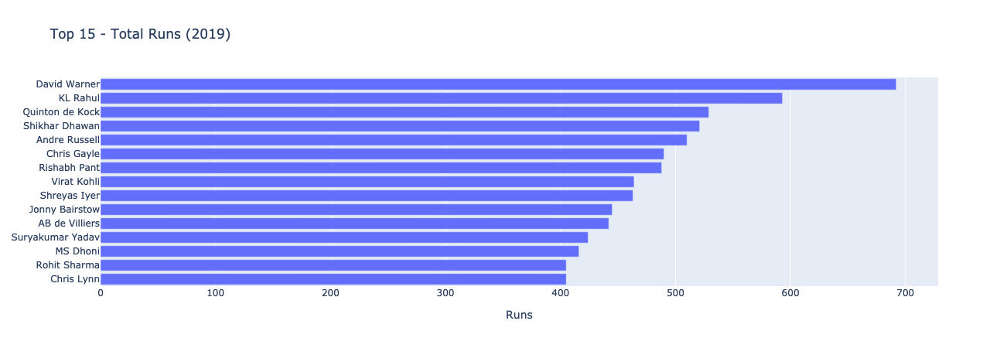

<IPython.core.display.Javascript object>

In [19]:
fig = go.Figure()
fig.add_trace(
    go.Bar(x=most_runs_2019["Runs"][:15], y=most_runs_2019.index[:15], orientation="h",)
)
fig.update_layout(
    title="Top 15 - Total Runs (2019)",
    yaxis=dict(autorange="reversed"),
    xaxis=dict(title="Runs"),
)
fig.show()

In [20]:
# Do overseas players makes more runs
batting.groupby("Nationality")["Runs"].describe()

,count,mean,std,min,25%,50%,75%,max
Nationality,,,,,,,,
Indian,686.0,177.600583,158.009759,8.0,43.0,122.0,287.0,973.0
Overseas,514.0,182.178988,158.506600,8.0,53.0,137.5,276.0,848.0


<IPython.core.display.Javascript object>

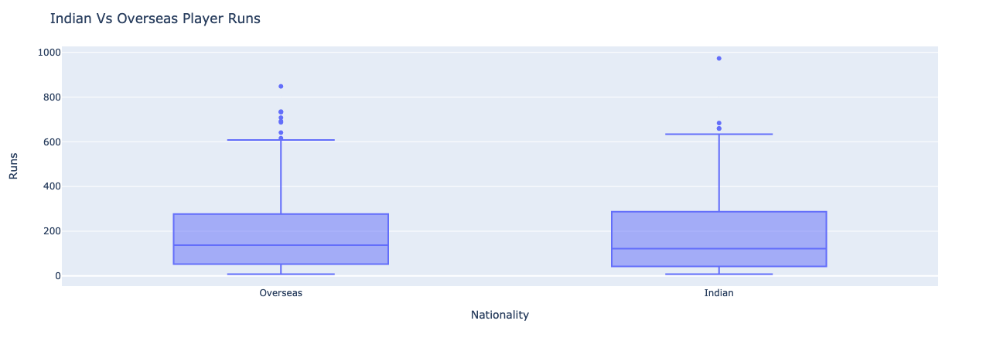

<IPython.core.display.Javascript object>

In [21]:
fig = px.box(batting, x="Nationality", y="Runs")
fig.update_layout(title="Indian Vs Overseas Player Runs")
fig.show()

On average, overseas players makes little bit more runs than Indian players. But Indians Perform little bit better
in the top part of the distributions. More or less, There isn't too much differences in runs made by Indian and 
Overseas players.

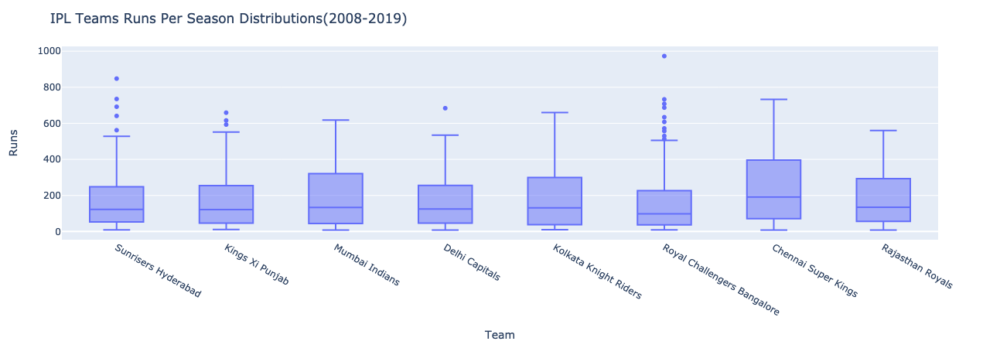

<IPython.core.display.Javascript object>

In [22]:
# how the runs made by teams vary, is there any big differences in runs
fig = px.box(batting[batting["Team"] != "Nan"], x="Team", y="Runs")
fig.update_layout(title="IPL Teams Runs Per Season Distributions(2008-2019)")
fig.show()

In [23]:
batting.groupby("Team")["Runs"].describe()

,count,mean,std,min,25%,50%,75%,max
Team,,,,,,,,
Chennai Super Kings,104.0,235.894231,178.819805,8.0,71.50,191.5,396.00,733.0
Delhi Capitals,138.0,166.862319,143.552894,8.0,47.00,125.0,255.75,684.0
Kings Xi Punjab,154.0,167.961039,146.124349,11.0,47.25,122.0,254.00,659.0
Kolkata Knight Riders,140.0,178.664286,153.182527,10.0,38.75,131.5,298.00,660.0
Mumbai Indians,153.0,187.627451,158.783860,8.0,45.00,133.0,320.00,618.0
Nan,151.0,171.066225,138.924520,14.0,49.50,127.0,280.00,569.0
Rajasthan Royals,115.0,178.547826,147.096176,8.0,56.50,135.0,293.00,560.0
Royal Challengers Bangalore,157.0,166.082803,177.777373,9.0,37.00,98.0,226.00,973.0
Sunrisers Hyderabad,88.0,180.556818,179.561974,9.0,52.75,122.5,246.00,848.0


<IPython.core.display.Javascript object>

On average, Chennai Super Kings players makes 48 runs more than the Mumbai Indians players. The upper 50% of CSK also perform better than the Mumbai Indians. Mumbai Indians and Kolkata Knight Riders tends to perform similarly although on average mumbai indians do little better. Other teams perform relatively similar, not so good. And There are more outliers in the Royal Challenger Banglore due to Virat Kohli and AB de villiers and some outliers in Sunrisers Hyderabad,which is David Warner. 

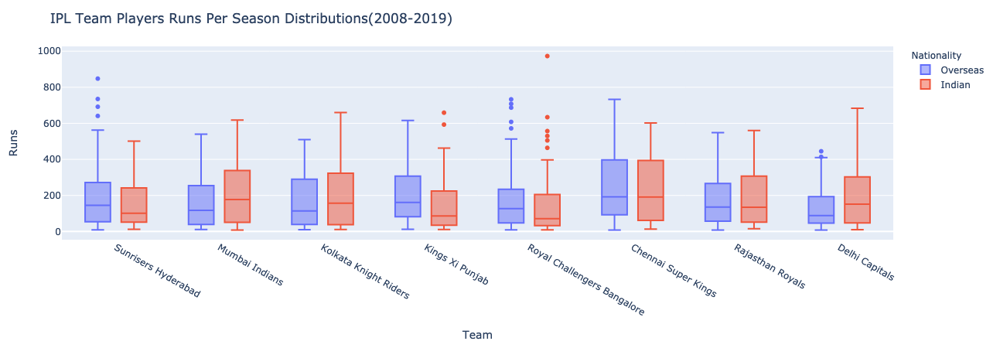

<IPython.core.display.Javascript object>

In [24]:
# how the runs made by teams vary, is there any big differences in runs
fig = px.box(batting[batting["Team"] != "Nan"], x="Team", y="Runs", color="Nationality")
fig.update_layout(title="IPL Team Players Runs Per Season Distributions(2008-2019)")
fig.show()

* Overseas players - Sunrisers Hydrabad, Kings XI Punjab, Chennai Super Kings, Royal Challengers Banglore.
* Indian Players - Mumbai Indians, Kolkata Knight Riders, Rajasthan Royals, Delhi Capitals.

In [25]:
unique_players = batting["PLAYER"].unique()

<IPython.core.display.Javascript object>

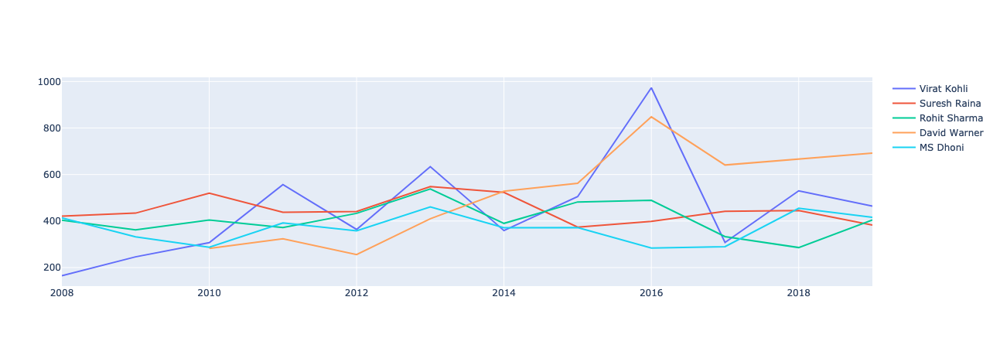

<IPython.core.display.Javascript object>

In [26]:
fig = go.Figure()
player_list = [
    "Virat Kohli",
    "Suresh Raina",
    "Rohit Sharma",
    "Shikar Dhawan",
    "David Warner",
    "MS Dhoni",
]
for player in player_list:
    fig.add_trace(
        go.Scatter(
            x=batting[batting["PLAYER"] == player]["Season"],
            y=batting[batting["PLAYER"] == player]["Runs"],
            mode="lines",
            name=player,
        )
    )
fig.show()

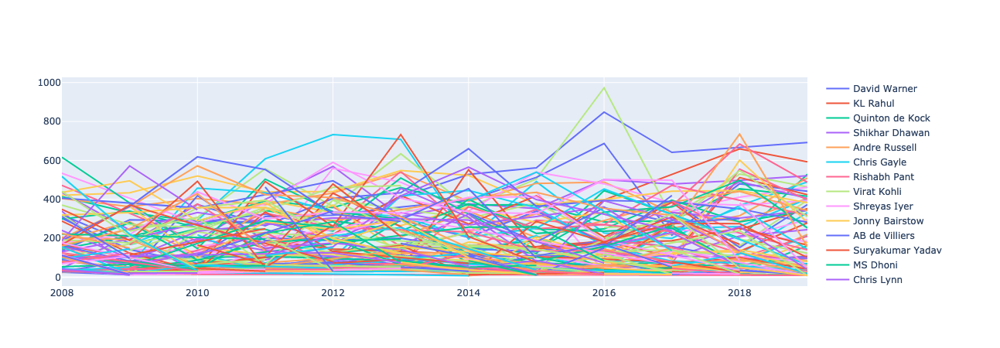

<IPython.core.display.Javascript object>

In [27]:
unique_players = batting["PLAYER"].unique()
fig = go.Figure()
for player in unique_players:
    fig.add_trace(
        go.Scatter(
            x=batting[batting["PLAYER"] == player]["Season"],
            y=batting[batting["PLAYER"] == player]["Runs"],
            mode="lines",
            name=player,
        )
    )
fig.show()

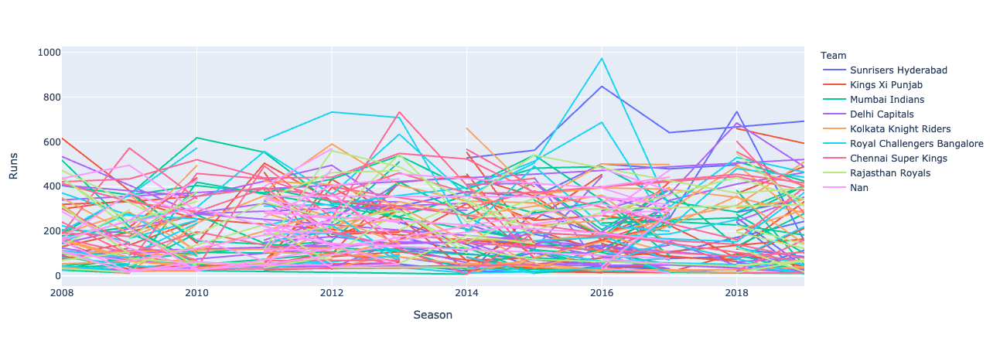

<IPython.core.display.Javascript object>

In [28]:
fig = px.line(batting, x="Season", y="Runs", color="Team", line_group="PLAYER")
fig.show()

In [29]:
team_season_runs = batting.groupby(["Team", "Season"])["Runs"].sum().reset_index()
team_season_runs = team_season_runs[team_season_runs["Team"] != "Nan"]
team_season_runs

,Team,Season,Runs
0,Chennai Super Kings,2008,2303
1,Chennai Super Kings,2009,2062
2,Chennai Super Kings,2010,2330
3,Chennai Super Kings,2011,2441
4,Chennai Super Kings,2012,2659
...,...,...,...
91,Sunrisers Hyderabad,2015,2114
92,Sunrisers Hyderabad,2016,2536
93,Sunrisers Hyderabad,2017,2245
94,Sunrisers Hyderabad,2018,2589


<IPython.core.display.Javascript object>

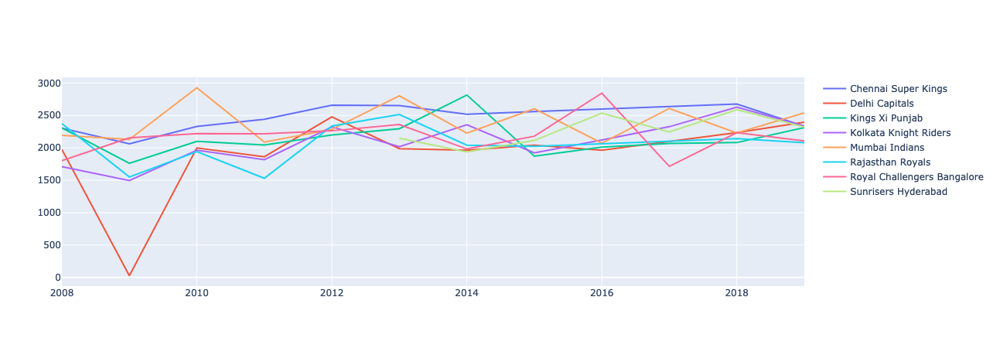

<IPython.core.display.Javascript object>

In [30]:
fig = go.Figure()
unique_teams = team_season_runs["Team"].unique()
for team in unique_teams:
    fig.add_trace(
        go.Scatter(
            x=team_season_runs[team_season_runs["Team"] == team]["Season"],
            y=team_season_runs[team_season_runs["Team"] == team]["Runs"],
            mode="lines",
            name=team,
        )
    )
fig.show()

In [31]:
team_season_runs["Runs"].min()

26

<IPython.core.display.Javascript object>

In [32]:
team_season_runs["Runs"].max()

2927

<IPython.core.display.Javascript object>

In [33]:
team_season_runs[team_season_runs["Runs"] == 26]

,Team,Season,Runs
11,Delhi Capitals,2009,26


<IPython.core.display.Javascript object>

In [34]:
batting[(batting["Team"] == "Delhi Capitals") & (batting["Season"] == 2009)]

,POS,PLAYER,Mat,Inns,NO,Runs,HS,Avg,BF,SR,100,50,4s,6s,Nationality,Player Link,Team,Season
1077,78,Amit Mishra,11,5,2,26,13,8.66,20,130.0,0,0,2,2,Indian,https://www.iplt20.com/teams/delhi-capitals/sq...,Delhi Capitals,2009


<IPython.core.display.Javascript object>

## Players Runs Probability

In [35]:
virat_df = batting[batting["PLAYER"] == "Virat Kohli"]
# what is the probability that virat will make more than 500 runs in IPL 2020
round(len(virat_df[virat_df["Runs"] > 500]) / len(virat_df) * 100, 1)

41.7

<IPython.core.display.Javascript object>

In [36]:
player_list = ["Virat Kohli", "MS Dhoni", "David Warner", "KL Rahul", "Rohit Sharma"]
print("Probability of making more than 500 runs in IPL 2020 Season.")
print()
for player in player_list:
    player_df = batting[batting["PLAYER"] == player]
    prob = len(player_df[player_df["Runs"] > 500]) / len(player_df)
    print("{} : {:.1%}".format(player, prob))

Probability of making more than 500 runs in IPL 2020 Season.

Virat Kohli : 41.7%
MS Dhoni : 0.0%
David Warner : 55.6%
KL Rahul : 40.0%
Rohit Sharma : 8.3%


<IPython.core.display.Javascript object>

In [37]:
player_list = ["Virat Kohli", "MS Dhoni", "David Warner", "KL Rahul", "Rohit Sharma"]
print("Probability of making more than 400 runs in IPL 2020 Season.")
print()
for player in player_list:
    player_df = batting[batting["PLAYER"] == player]
    prob = len(player_df[player_df["Runs"] > 400]) / len(player_df)
    print("{} : {:.1%}".format(player, prob))

Probability of making more than 400 runs in IPL 2020 Season.

Virat Kohli : 50.0%
MS Dhoni : 33.3%
David Warner : 66.7%
KL Rahul : 40.0%
Rohit Sharma : 58.3%


<IPython.core.display.Javascript object>

In [38]:
batting[batting["PLAYER"] == "KL Rahul"]

,POS,PLAYER,Mat,Inns,NO,Runs,HS,Avg,BF,SR,100,50,4s,6s,Nationality,Player Link,Team,Season
1,2,KL Rahul,14,14,3,593,100,53.90,438,135.38,1,6,49,25,Indian,https://www.iplt20.com/teams/kings-xi-punjab/s...,Kings Xi Punjab,2019
102,3,KL Rahul,14,14,2,659,95,54.91,416,158.41,0,6,66,32,Indian,https://www.iplt20.com/teams/kings-xi-punjab/s...,Kings Xi Punjab,2018
310,11,KL Rahul,14,12,3,397,68,44.11,271,146.49,0,4,37,16,Indian,https://www.iplt20.com/teams/royal-challengers...,Royal Challengers Bangalore,2016
445,46,KL Rahul,9,8,3,142,44,28.40,126,112.69,0,0,8,5,Indian,https://www.iplt20.com/teams/sunrisers-hyderab...,Sunrisers Hyderabad,2015
540,41,KL Rahul,11,8,0,166,46,20.75,164,101.21,0,0,12,3,Indian,https://www.iplt20.com/teams/sunrisers-hyderab...,Sunrisers Hyderabad,2014


<IPython.core.display.Javascript object>

In [39]:
# what is the probability that someone will make more than 500 runs
round(len(batting[batting["Runs"] > 500]) / len(batting) * 100, 1)

4.2

<IPython.core.display.Javascript object>

In [40]:
# what is the probability that someone will make more than 400 runs
round(len(batting[batting["Runs"] > 400]) / len(batting) * 100, 1)

10.8

<IPython.core.display.Javascript object>

In [41]:
# What is the probability that someone will make more than 300 runs
round(len(batting[batting["Runs"] > 300]) / len(batting) * 100, 1)

22.5

<IPython.core.display.Javascript object>

### Player Team Runs Contribution

In [42]:
csk_df = batting[batting["Team"] == "Chennai Super Kings"].copy()

<IPython.core.display.Javascript object>

In [43]:
csk_df.sample(5)

,POS,PLAYER,Mat,Inns,NO,Runs,HS,Avg,BF,SR,100,50,4s,6s,Nationality,Player Link,Team,Season
112,13,MS Dhoni,16,15,9,455,79,75.83,302,150.66,0,3,24,30,Indian,https://www.iplt20.com/teams/chennai-super-kin...,Chennai Super Kings,2018
196,97,Shardul Thakur,13,1,1,15,15,0.00,5,300.00,0,0,3,0,Indian,https://www.iplt20.com/teams/chennai-super-kin...,Chennai Super Kings,2018
174,75,Deepak Chahar,12,4,1,50,39,16.66,29,172.41,0,0,1,4,Indian,https://www.iplt20.com/teams/chennai-super-kin...,Chennai Super Kings,2018
717,18,MS Dhoni,19,17,5,358,51,29.83,278,128.77,0,1,26,9,Indian,https://www.iplt20.com/teams/chennai-super-kin...,Chennai Super Kings,2012
765,66,Albie Morkel,16,12,5,107,28,15.28,68,157.35,0,0,5,6,Overseas,https://www.iplt20.com/teams/chennai-super-kin...,Chennai Super Kings,2012


<IPython.core.display.Javascript object>

In [44]:
csk_runs_table = (
    csk_df.groupby("PLAYER")["Runs"]
    .sum()
    .reset_index()
    .sort_values(by="Runs", ascending=False)
)
csk_runs_table.head(10)

,PLAYER,Runs
34,Suresh Raina,4527
15,MS Dhoni,3858
18,Michael Hussey,1768
22,Murali Vijay,1664
8,Faf du Plessis,1639
33,Subramaniam Badrinath,1441
17,Matthew Hayden,1107
7,Dwayne Smith,965
29,Shane Watson,953
6,Dwayne Bravo,916


<IPython.core.display.Javascript object>

In [45]:
csk_runs_table

,PLAYER,Runs
34,Suresh Raina,4527
15,MS Dhoni,3858
18,Michael Hussey,1768
22,Murali Vijay,1664
8,Faf du Plessis,1639
33,Subramaniam Badrinath,1441
17,Matthew Hayden,1107
7,Dwayne Smith,965
29,Shane Watson,953
6,Dwayne Bravo,916


<IPython.core.display.Javascript object>

In [46]:
batting[batting["PLAYER"] == "Shane Watson"]

,POS,PLAYER,Mat,Inns,NO,Runs,HS,Avg,BF,SR,100,50,4s,6s,Nationality,Player Link,Team,Season
16,17,Shane Watson,17,17,0,398,96,23.41,312,127.56,0,3,42,20,Overseas,https://www.iplt20.com/teams/chennai-super-kin...,Chennai Super Kings,2019
104,5,Shane Watson,15,15,1,555,117,39.64,359,154.59,2,2,44,35,Overseas,https://www.iplt20.com/teams/chennai-super-kin...,Chennai Super Kings,2018
263,64,Shane Watson,8,7,1,71,24,11.83,78,91.02,0,0,6,1,Overseas,https://www.iplt20.com/teams/royal-challengers...,Royal Challengers Bangalore,2017
338,39,Shane Watson,16,15,2,179,36,13.76,134,133.58,0,0,14,12,Overseas,https://www.iplt20.com/teams/royal-challengers...,Royal Challengers Bangalore,2016
418,19,Shane Watson,10,9,1,347,104,43.37,257,135.01,1,1,37,14,Overseas,https://www.iplt20.com/teams/rajasthan-royals/...,Rajasthan Royals,2015
532,33,Shane Watson,13,13,1,240,51,20.00,196,122.44,0,2,19,14,Overseas,https://www.iplt20.com/teams/rajasthan-royals/...,Rajasthan Royals,2014
604,5,Shane Watson,16,16,2,543,101,38.78,380,142.89,1,2,59,22,Overseas,https://www.iplt20.com/teams/rajasthan-royals/...,Rajasthan Royals,2013
734,35,Shane Watson,7,7,1,255,90,42.50,168,151.78,0,2,26,14,Overseas,https://www.iplt20.com/teams/rajasthan-royals/...,Rajasthan Royals,2012
823,24,Shane Watson,11,11,1,330,89,33.00,253,130.43,0,1,31,17,Overseas,https://www.iplt20.com/teams/rajasthan-royals/...,Rajasthan Royals,2011
940,41,Shane Watson,6,5,0,185,60,37.00,114,162.28,0,2,18,9,Overseas,https://www.iplt20.com/teams/rajasthan-royals/...,Rajasthan Royals,2010


<IPython.core.display.Javascript object>

Looking at a players all seasons aggregated  data for team contribution will give wrong idea about their contribution
as in this case of Shane Watson. Most of his career in IPL he played for Rajasthan Royals, then RCB and now for CSK.
It will be much insightful and correct if we will look player team contribution for each season separately because
a player not always plays for the same team in every season, it depends on the auction.

In [47]:
csk_2019_df = batting[
    (batting["Team"] == "Chennai Super Kings") & (batting["Season"] == 2019)
]

<IPython.core.display.Javascript object>

In [48]:
csk_2019_runs = (
    csk_2019_df.groupby("PLAYER")["Runs"]
    .sum()
    .reset_index()
    .sort_values(by="Runs", ascending=False)
)
csk_2019_runs

,PLAYER,Runs
4,MS Dhoni,416
8,Shane Watson,398
2,Faf du Plessis,396
10,Suresh Raina,383
0,Ambati Rayudu,282
3,Kedar Jadhav,162
7,Ravindra Jadeja,106
1,Dwayne Bravo,80
6,Murali Vijay,64
5,Mitchell Santner,32


<IPython.core.display.Javascript object>

In [49]:
csk_2019_runs["% Team Runs"] = (
    csk_2019_runs["Runs"]
    .apply(lambda x: (x / csk_2019_runs["Runs"].sum() * 100))
    .round(1)
)
csk_2019_runs

,PLAYER,Runs,% Team Runs
4,MS Dhoni,416,17.8
8,Shane Watson,398,17.1
2,Faf du Plessis,396,17.0
10,Suresh Raina,383,16.4
0,Ambati Rayudu,282,12.1
3,Kedar Jadhav,162,6.9
7,Ravindra Jadeja,106,4.5
1,Dwayne Bravo,80,3.4
6,Murali Vijay,64,2.7
5,Mitchell Santner,32,1.4


<IPython.core.display.Javascript object>

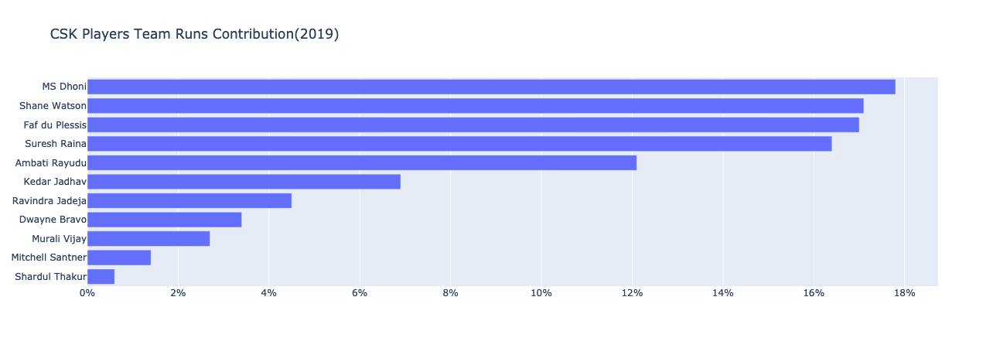

<IPython.core.display.Javascript object>

In [50]:
fig = go.Figure()
fig.add_trace(
    go.Bar(x=csk_2019_runs["% Team Runs"], y=csk_2019_runs["PLAYER"], orientation="h")
)
fig.update_layout(
    title="CSK Players Team Runs Contribution(2019)",
    yaxis=dict(autorange="reversed"),
    xaxis=dict(ticksuffix="%"),
)
fig.show()

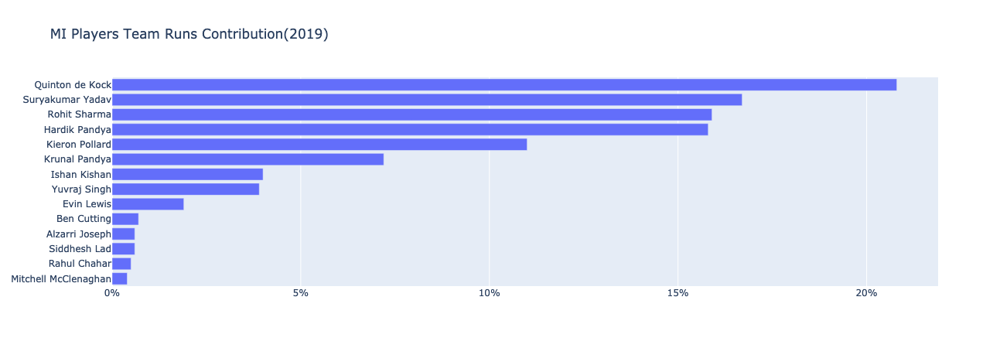

<IPython.core.display.Javascript object>

In [51]:
mi_2019_df = batting[
    (batting["Team"] == "Mumbai Indians") & (batting["Season"] == 2019)
]

mi_2019_runs = (
    mi_2019_df.groupby("PLAYER")["Runs"]
    .sum()
    .reset_index()
    .sort_values(by="Runs", ascending=False)
)

mi_2019_runs["% Team Runs"] = (
    mi_2019_runs["Runs"]
    .apply(lambda x: (x / mi_2019_runs["Runs"].sum() * 100))
    .round(1)
)

fig = go.Figure()
fig.add_trace(
    go.Bar(x=mi_2019_runs["% Team Runs"], y=mi_2019_runs["PLAYER"], orientation="h")
)
fig.update_layout(
    title="MI Players Team Runs Contribution(2019)",
    yaxis=dict(autorange="reversed"),
    xaxis=dict(ticksuffix="%"),
)
fig.show()

### Correlation

In [52]:
batting.head()

,POS,PLAYER,Mat,Inns,NO,Runs,HS,Avg,BF,SR,100,50,4s,6s,Nationality,Player Link,Team,Season
0,1,David Warner,12,12,2,692,100,69.20,481,143.86,1,8,57,21,Overseas,https://www.iplt20.com/teams/sunrisers-hyderab...,Sunrisers Hyderabad,2019
1,2,KL Rahul,14,14,3,593,100,53.90,438,135.38,1,6,49,25,Indian,https://www.iplt20.com/teams/kings-xi-punjab/s...,Kings Xi Punjab,2019
2,3,Quinton de Kock,16,16,1,529,81,35.26,398,132.91,0,4,45,25,Overseas,https://www.iplt20.com/teams/mumbai-indians/sq...,Mumbai Indians,2019
3,4,Shikhar Dhawan,16,16,1,521,97,34.73,384,135.67,0,5,64,11,Indian,https://www.iplt20.com/teams/delhi-capitals/sq...,Delhi Capitals,2019
4,5,Andre Russell,14,13,4,510,80,56.66,249,204.81,0,4,31,52,Overseas,https://www.iplt20.com/teams/kolkata-knight-ri...,Kolkata Knight Riders,2019


<IPython.core.display.Javascript object>

In [53]:
corr_matrix = batting.corr()

<IPython.core.display.Javascript object>

In [54]:
corr_matrix

,POS,Mat,Inns,NO,Runs,HS,Avg,BF,SR,100,50,4s,6s,Season
POS,1.000000,-0.622772,-0.865670,-0.184943,-0.920866,-0.853973,-0.635288,-0.918003,-0.276432,-0.266817,-0.736789,-0.864975,-0.749946,0.000000
Mat,-0.622772,1.000000,0.851611,0.490681,0.623965,0.415562,0.236122,0.631978,0.176755,0.108939,0.432748,0.561744,0.500908,0.046817
Inns,-0.865670,0.851611,1.000000,0.366267,0.844862,0.656483,0.390981,0.861072,0.172262,0.174134,0.617592,0.781423,0.672001,0.024306
NO,-0.184943,0.490681,0.366267,1.000000,0.171229,0.043254,0.336421,0.149935,0.162142,0.020097,0.063168,0.052398,0.195627,0.040927
Runs,-0.920866,0.623965,0.844862,0.171229,1.000000,0.842706,0.639538,0.978763,0.276514,0.377490,0.863561,0.948849,0.826506,0.044263
HS,-0.853973,0.415562,0.656483,0.043254,0.842706,1.000000,0.689945,0.809206,0.328017,0.455472,0.735101,0.807215,0.741245,0.025088
Avg,-0.635288,0.236122,0.390981,0.336421,0.639538,0.689945,1.000000,0.592607,0.344064,0.341430,0.575483,0.570086,0.579200,-0.000446
BF,-0.918003,0.631978,0.861072,0.149935,0.978763,0.809206,0.592607,1.000000,0.150092,0.315768,0.837828,0.940724,0.733600,0.008664
SR,-0.276432,0.176755,0.172262,0.162142,0.276514,0.328017,0.344064,0.150092,1.000000,0.172059,0.227166,0.233867,0.429392,0.149012
100,-0.266817,0.108939,0.174134,0.020097,0.377490,0.455472,0.341430,0.315768,0.172059,1.000000,0.239519,0.353105,0.415510,0.020162


<IPython.core.display.Javascript object>

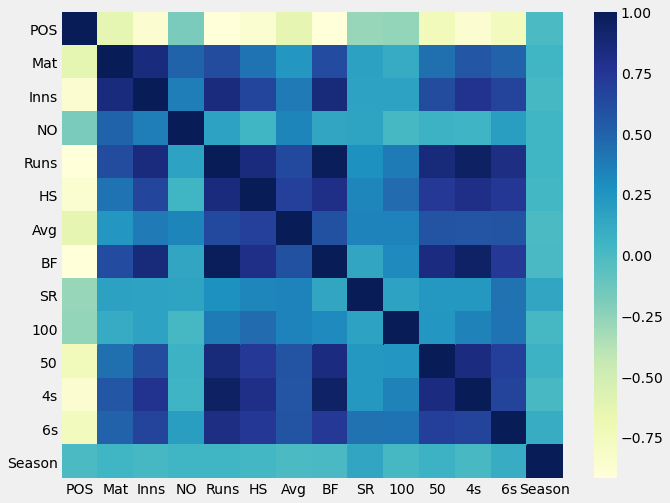

<IPython.core.display.Javascript object>

In [55]:
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, cmap="YlGnBu")

In [56]:
corr_matrix["Runs"].sort_values(ascending=False)

Runs      1.000000
BF        0.978763
4s        0.948849
50        0.863561
Inns      0.844862
HS        0.842706
6s        0.826506
Avg       0.639538
Mat       0.623965
100       0.377490
SR        0.276514
NO        0.171229
Season    0.044263
POS      -0.920866
Name: Runs, dtype: float64

<IPython.core.display.Javascript object>

### Scatter Plots

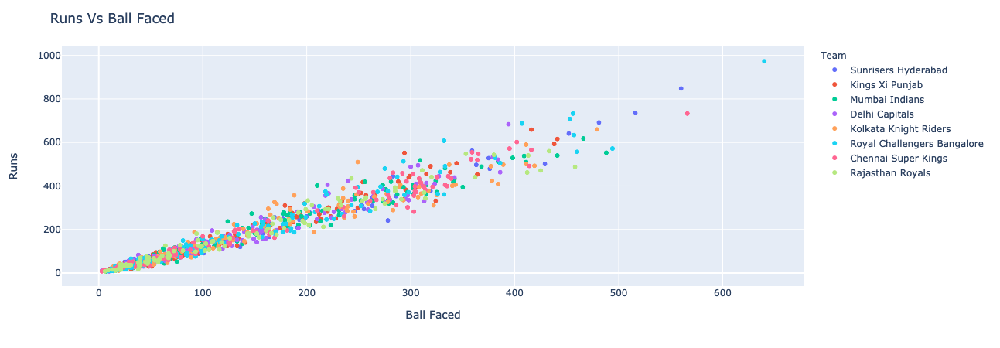

<IPython.core.display.Javascript object>

In [57]:
fig = px.scatter(
    batting[batting["Team"] != "Nan"],
    x="BF",
    y="Runs",
    color="Team",
    hover_name="PLAYER",
    hover_data=["Season"],
    labels={"BF": "Ball Faced"},
)
fig.update_layout(title="Runs Vs Ball Faced")
fig.show()

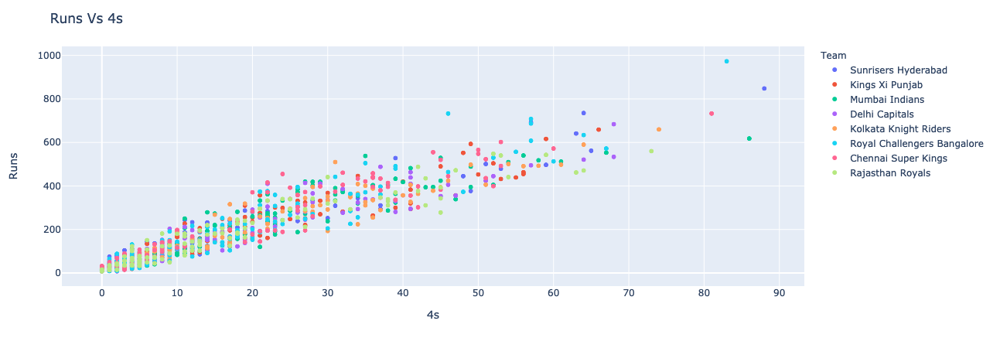

<IPython.core.display.Javascript object>

In [58]:
fig = px.scatter(
    batting[batting["Team"] != "Nan"],
    x="4s",
    y="Runs",
    color="Team",
    hover_name="PLAYER",
    hover_data=["Season"],
)
fig.update_layout(title="Runs Vs 4s")
fig.show()

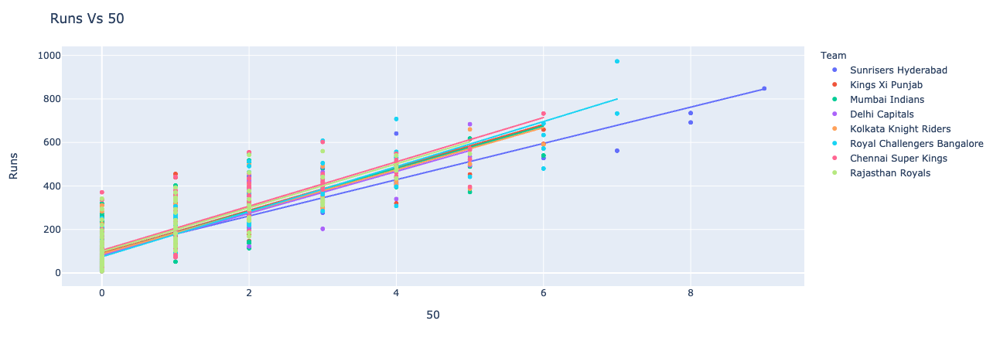

<IPython.core.display.Javascript object>

In [59]:
fig = px.scatter(
    batting[batting["Team"] != "Nan"],
    x="50",
    y="Runs",
    color="Team",
    hover_name="PLAYER",
    hover_data=["Season"],
    trendline="ols",
)
fig.update_layout(title="Runs Vs 50")
fig.show()

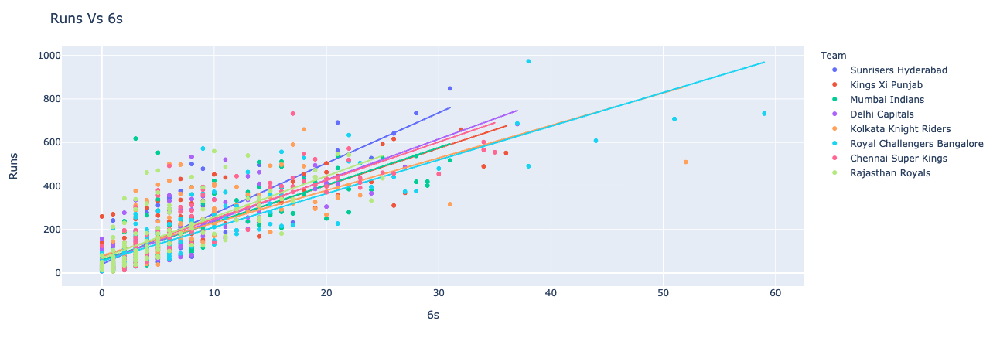

<IPython.core.display.Javascript object>

In [60]:
fig = px.scatter(
    batting[batting["Team"] != "Nan"],
    x="6s",
    y="Runs",
    color="Team",
    hover_name="PLAYER",
    hover_data=["Season"],
    trendline="ols",
)
fig.update_layout(title="Runs Vs 6s")
fig.show()

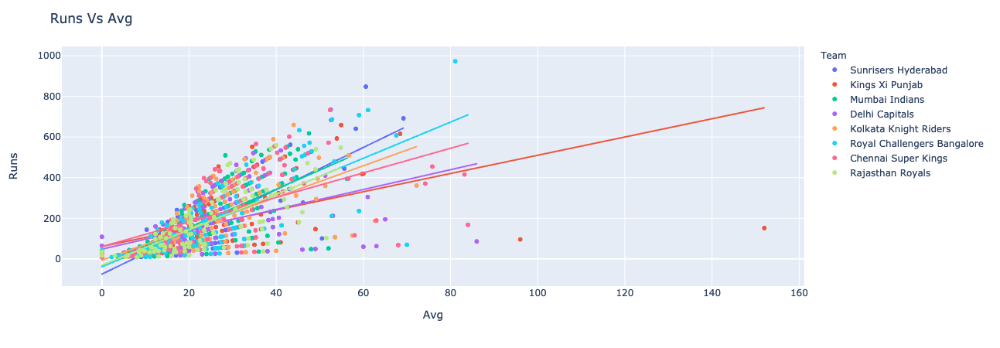

<IPython.core.display.Javascript object>

In [61]:
fig = px.scatter(
    batting[batting["Team"] != "Nan"],
    x="Avg",
    y="Runs",
    color="Team",
    hover_name="PLAYER",
    hover_data=["Season"],
    trendline="ols",
)
fig.update_layout(title="Runs Vs Avg")
fig.show()

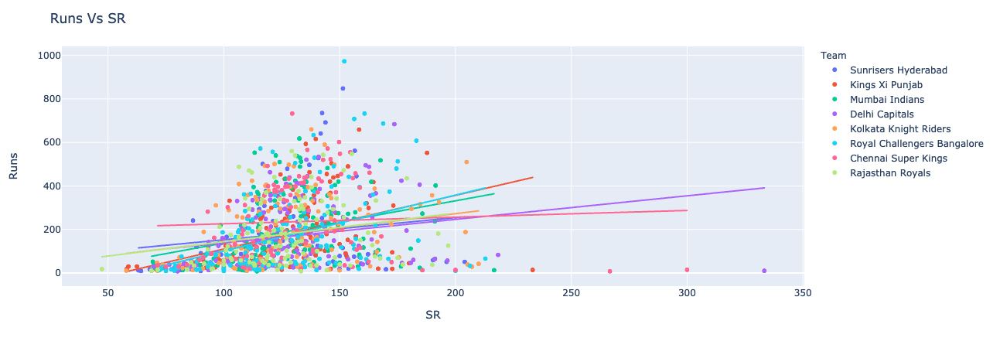

<IPython.core.display.Javascript object>

In [62]:
fig = px.scatter(
    batting[batting["Team"] != "Nan"],
    x="SR",
    y="Runs",
    color="Team",
    hover_name="PLAYER",
    hover_data=["Season"],
    trendline="ols",
)
fig.update_layout(title="Runs Vs SR")
fig.show()

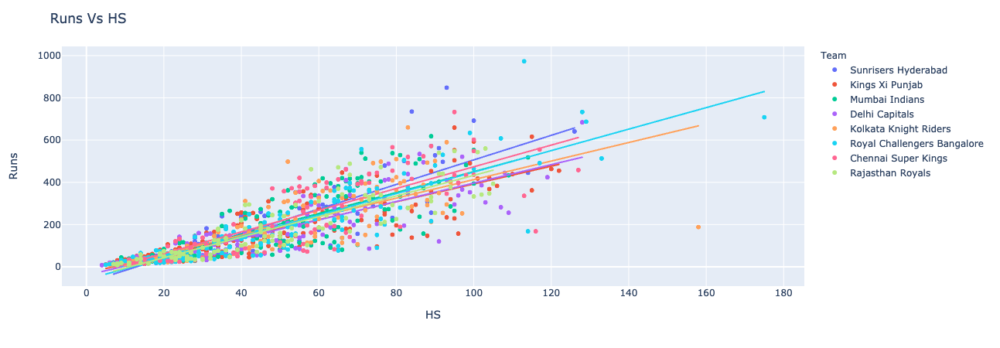

<IPython.core.display.Javascript object>

In [63]:
fig = px.scatter(
    batting[batting["Team"] != "Nan"],
    x="HS",
    y="Runs",
    color="Team",
    hover_name="PLAYER",
    hover_data=["Season"],
    trendline="ols",
)
fig.update_layout(title="Runs Vs HS")
fig.show()

### Balls Faced

In [64]:
batting.head()

,POS,PLAYER,Mat,Inns,NO,Runs,HS,Avg,BF,SR,100,50,4s,6s,Nationality,Player Link,Team,Season
0,1,David Warner,12,12,2,692,100,69.20,481,143.86,1,8,57,21,Overseas,https://www.iplt20.com/teams/sunrisers-hyderab...,Sunrisers Hyderabad,2019
1,2,KL Rahul,14,14,3,593,100,53.90,438,135.38,1,6,49,25,Indian,https://www.iplt20.com/teams/kings-xi-punjab/s...,Kings Xi Punjab,2019
2,3,Quinton de Kock,16,16,1,529,81,35.26,398,132.91,0,4,45,25,Overseas,https://www.iplt20.com/teams/mumbai-indians/sq...,Mumbai Indians,2019
3,4,Shikhar Dhawan,16,16,1,521,97,34.73,384,135.67,0,5,64,11,Indian,https://www.iplt20.com/teams/delhi-capitals/sq...,Delhi Capitals,2019
4,5,Andre Russell,14,13,4,510,80,56.66,249,204.81,0,4,31,52,Overseas,https://www.iplt20.com/teams/kolkata-knight-ri...,Kolkata Knight Riders,2019


<IPython.core.display.Javascript object>

In [65]:
batting["BF"].describe()

count    1200.000000
mean      138.899167
std       115.168553
min         3.000000
25%        41.000000
50%       102.500000
75%       215.250000
max       640.000000
Name: BF, dtype: float64

<IPython.core.display.Javascript object>

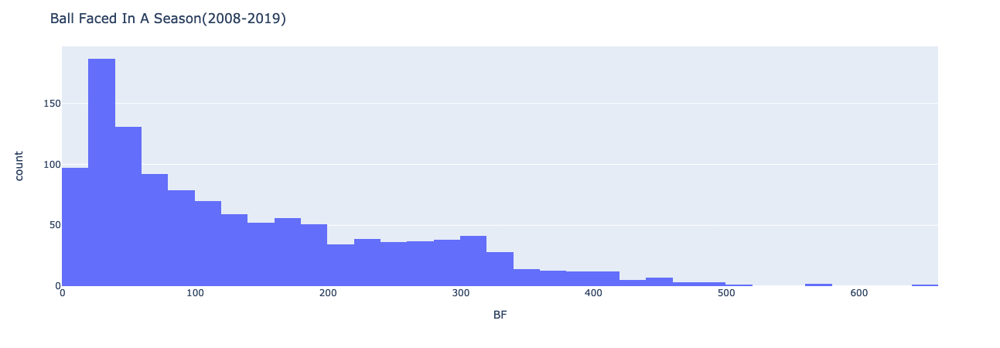

<IPython.core.display.Javascript object>

In [66]:
fig = px.histogram(batting, x="BF")
fig.update_layout(title="Ball Faced In A Season(2008-2019)")
fig.show()

## 4s

In [67]:
batting["4s"].describe()

count    1200.000000
mean       16.551667
std        16.232948
min         0.000000
25%         4.000000
50%        11.000000
75%        25.000000
max        88.000000
Name: 4s, dtype: float64

<IPython.core.display.Javascript object>

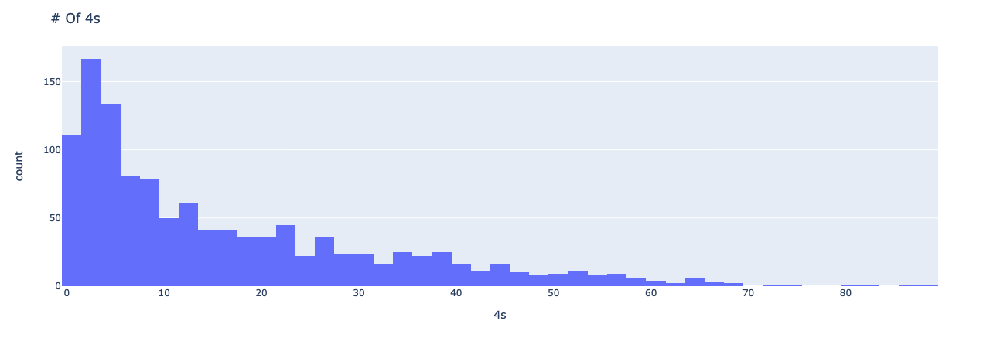

<IPython.core.display.Javascript object>

In [68]:
fig = px.histogram(batting, x="4s")
fig.update_layout(title="# Of 4s ")
fig.show()

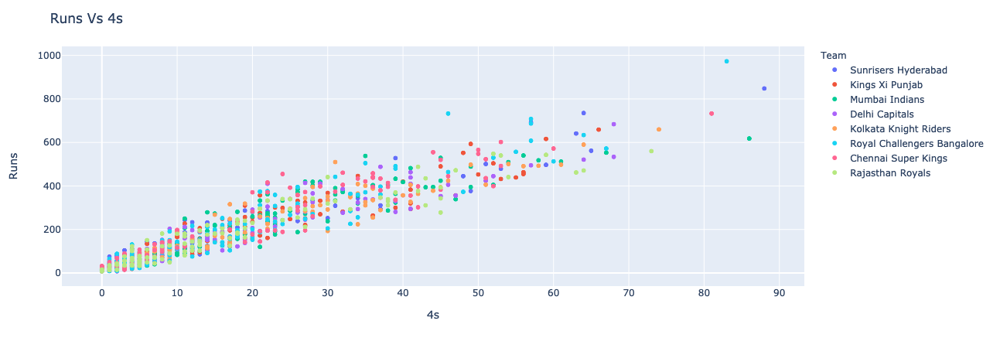

<IPython.core.display.Javascript object>

In [69]:
fig = px.scatter(
    batting[batting["Team"] != "Nan"],
    x="4s",
    y="Runs",
    color="Team",
    hover_name="PLAYER",
    hover_data=["Season"],
)
fig.update_layout(title="Runs Vs 4s")
fig.show()

In [70]:
np.percentile(batting["4s"], 80)

29.0

<IPython.core.display.Javascript object>

### 50

In [71]:
batting["50"].describe()

count    1200.000000
mean        0.917500
std         1.413869
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         9.000000
Name: 50, dtype: float64

<IPython.core.display.Javascript object>

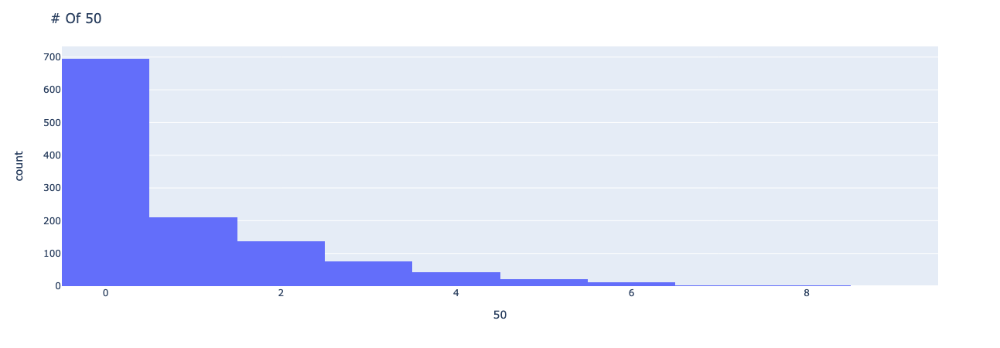

<IPython.core.display.Javascript object>

In [72]:
fig = px.histogram(batting, x="50")
fig.update_layout(title="# Of 50 ")
fig.show()

## Hs

In [73]:
batting["100"].describe()

count    1200.000000
mean        0.047500
std         0.245548
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         4.000000
Name: 100, dtype: float64

<IPython.core.display.Javascript object>

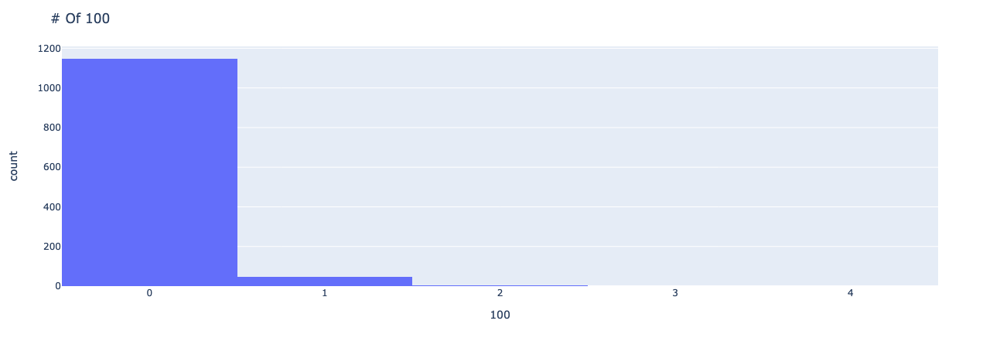

<IPython.core.display.Javascript object>

In [74]:
fig = px.histogram(batting, x="100")
fig.update_layout(title="# Of 100")
fig.show()

## 6s

In [75]:
batting["6s"].describe()

count    1200.000000
mean        6.703333
std         7.528006
min         0.000000
25%         1.000000
50%         4.000000
75%         9.000000
max        59.000000
Name: 6s, dtype: float64

<IPython.core.display.Javascript object>

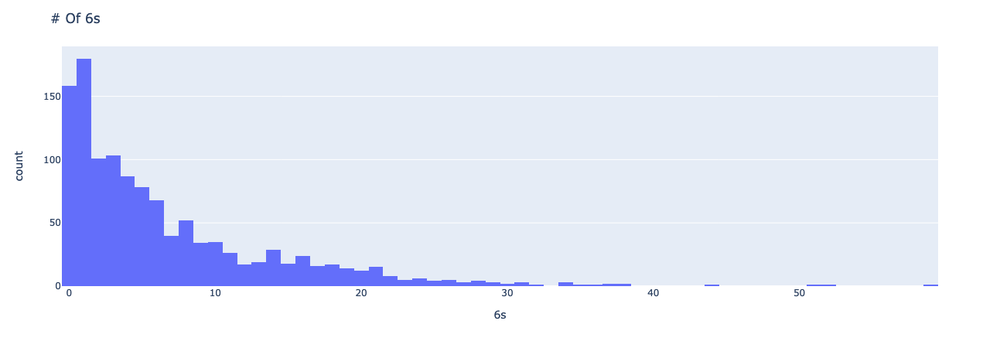

<IPython.core.display.Javascript object>

In [76]:
fig = px.histogram(batting, x="6s")
fig.update_layout(title="# Of 6s")
fig.show()

In [77]:
np.percentile(batting["6s"], 80)

11.0

<IPython.core.display.Javascript object>

## Avg

In [78]:
batting["Avg"].describe()

count    1200.000000
mean       24.117200
std        14.151347
min         0.000000
25%        14.060000
50%        22.480000
75%        31.000000
max       152.000000
Name: Avg, dtype: float64

<IPython.core.display.Javascript object>

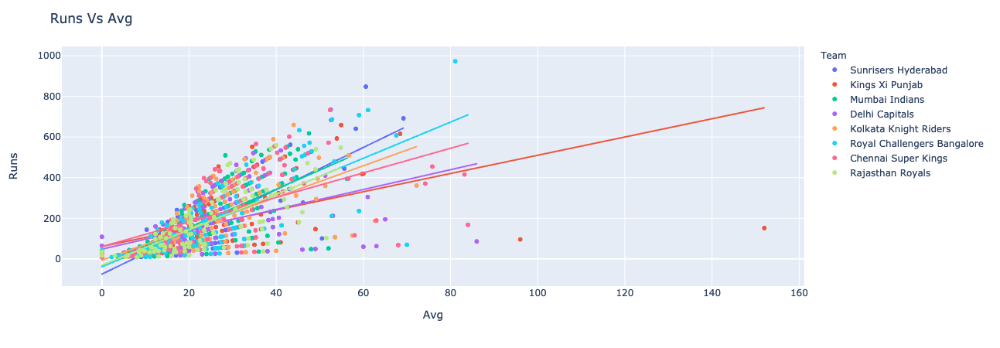

<IPython.core.display.Javascript object>

In [79]:
fig = px.scatter(
    batting[batting["Team"] != "Nan"],
    x="Avg",
    y="Runs",
    color="Team",
    hover_name="PLAYER",
    hover_data=["Season"],
    trendline="ols",
)
fig.update_layout(title="Runs Vs Avg")
fig.show()